# *k*-NN Prediction for Hourly Demand Forecast

##### by Winston Chiong

The contents of this Jupyter Notebook are based off the paper:

***Fast Prediction for Sparse Time Series: Demand Forecast of EV Charging Stations for Cell Phone Applications***

by Mostafa Majidpour, Student Member, IEEE, Charlie Qiu, Peter Chu, Rajit Gadh, Member, IEEE, and Hemanshu R. Pota, Member, IEEE.

Link to paper [here](https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=6966759).

The objective is to predict the future (24-hour forecasting horizon) energy consumption based on past energy consumption. 

$\large \hat{E}(t) = f(E(t-i), \epsilon(t)), \hspace{1cm} i \in \{1,2,\dots\}$,

where $\hat{E}(t)$ is the actual energy consumption at time $t$, $\hat{E}(t)$ is the prediction of energy consumption at time $t$, and $\epsilon(t)$ are variables other than past energy consumption, such as noise, that future energy consumption might depend on.

In [87]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from datetime import timedelta
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

Let's begin by loading our hourly demand dataframe.

In [88]:
hourly_energy_demand_df = pd.read_csv("data/hourlyenergydemand.csv")
hourly_energy_demand_df.set_index("time", inplace=True) 
hourly_energy_demand_df.index = pd.to_datetime(hourly_energy_demand_df.index)
hourly_energy_demand_df

,energy_demand,day,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,Federal Holiday,Academic Break
time,,,,,,,,,,,
2020-11-05 10:00:00,2.095333,Thursday,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0
2020-11-05 11:00:00,1.311083,Thursday,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0
2020-11-05 12:00:00,0.000000,Thursday,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0
2020-11-05 13:00:00,0.000000,Thursday,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0
2020-11-05 14:00:00,0.000000,Thursday,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2022-08-22 13:00:00,19.377250,Monday,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
2022-08-22 14:00:00,20.985083,Monday,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
2022-08-22 15:00:00,15.570583,Monday,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0


## Visualization

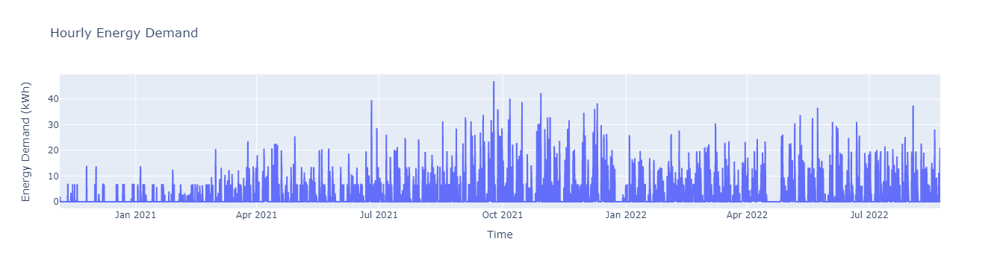

In [89]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = hourly_energy_demand_df.index  , y = hourly_energy_demand_df["energy_demand"], hovertext=hourly_energy_demand_df["day"]))
fig.update_layout(title = f"Hourly Energy Demand", xaxis_title = "Time", yaxis_title="Energy Demand (kWh)")
fig.show()

## Feature Engineering 

We can code up past hourly values as features; for example, a `lag1` column will have the previous day's power consumption at the same hour, a `lag2` column will have two days ago's power consumption at the same hour, etc.

`lag"N"` values will be the record from `N` days ago.

Depending on our depth of lags, some columns will have `NaN` as a value, as previous records don't exist. Let's drop those records. 

In [90]:
def create_lag_features(df, num_lag_depths):
    """Function takes in a dataframe with a 'energy_demand' column at hourly granularity, and returns a 
    new dataframe with lagged values; a "lag1" column will have the previous day's power demand at the same hour, 
    a "lag2" column will have two days ago's power demand at the same hour, etc. Function will drop rows with 
    any 'NaN' vlaues. """
    
    hourly_energy_demand_with_lags_df = df.copy(deep=True)
    for lag_depth in np.arange(1,num_lag_depths+1):
        hourly_energy_demand_with_lags_df["lag" + f"{lag_depth}"] = hourly_energy_demand_with_lags_df["energy_demand"].shift(24*lag_depth)
    return hourly_energy_demand_with_lags_df.dropna()


## Applied Algorithms

Here, our output is the prediction energy consumption for the next 24 hours. 


$\large y(t) = E(t)$

The input is the concatenation of the consumption history for $D$ previous days.

$\large x(t) = \{E(t-24),E(t-48),\dots,E(t-24D)\}$

### Historical Average

This algorithm is extremely simple used only a baseline to compare model accuracy. With the historical average approach the power consumption at time $t$, $\hat{E}(t)$ is predicted using the average of the past $D$ energy consumption records occuring at the same time. Formally, 

$\large \hat{E}(t) = \frac{1}{D} \sum\limits_{d = 1}^{D} E(t - 24d)$

Here, $D$ is the depth of averaging, which is a parameter to be tuned.

For example, using $D = 8$, to estimate the energy consumption tomorrow at 9 AM, we would take the average of the past 8 days' energy consumption at 9 PM.

In [114]:
def historical_average(df, averaging_depth):
    """This function takes in a dataframe, and depth of averaging, and returns new dataframe containing a datetime index
    and predicted energy demand, based on the historical average algorithm. Dataframe must have a datetime index, 
    a "energy_demand" column, and "lagN" columns, where a "lagN" column is the record from N days ago, at the same time."""
    # copy dataframe
    df_predictions = df.copy(deep = True)
    
    # select only lag columns up to averaging depth
    df_predictions = df_predictions[["lag" + f"{lag_depth}" for lag_depth in np.arange(1, averaging_depth+1)]]
    
    # average across each row 
    df_predictions["prediction_average_algo"] = df_predictions.mean(axis = 1) 

    # return datetime index and associated predictions
    return df_predictions[["prediction_average_algo"]]


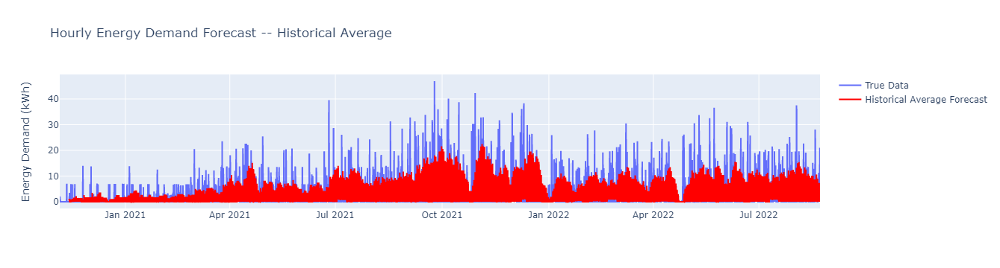

Test Set RMSE: 4.3721506431737005 kWh


In [166]:
num_lag_depths = averaging_depth = 8

# create dataframe
historical_average_df = create_lag_features(hourly_energy_demand_df, num_lag_depths)

# predict values using historical average
predictions_avg_algo_df = historical_average(historical_average_df, averaging_depth)

# calculate RMSE
rmse = mean_squared_error(
    y_true=hourly_energy_demand_df["energy_demand"].loc[hourly_energy_demand_df.index >= predictions_avg_algo_df.index[0]], #some records don't have predictions b/c no lagged values
    y_pred=predictions_avg_algo_df["prediction_average_algo"], squared=False)

# visuals
fig = go.Figure()
fig.add_trace(
    go.Scatter(x = hourly_energy_demand_df["energy_demand"].index , y = hourly_energy_demand_df["energy_demand"], name = "True Data",
               hovertext=hourly_energy_demand_df["day"])
)
fig.add_trace(
    go.Scatter(x = predictions_avg_algo_df.index, y = predictions_avg_algo_df["prediction_average_algo"] , name = "Historical Average Forecast" , line= {"color":"red"},
              hovertext=hourly_energy_demand_df["day"])
)

fig.update_layout({"title" : "Hourly Energy Demand Forecast -- Historical Average" , "yaxis_title" : "Energy Demand (kWh)"})
fig.show()
print(f"Test Set RMSE: {rmse} kWh")

#### Cross Validation

For the historical average algorithm, we can simply iterate through different values of $D$ (the depth of averaging) on a training set, find the value of $D$ with the lowest RMSE, and report the RMSE on the test set using the optimal $D$ value.

Let's withhold the last 20% of our data as our test set.

In [93]:
train, test = train_test_split(hourly_energy_demand_df, test_size=0.2, shuffle=False)

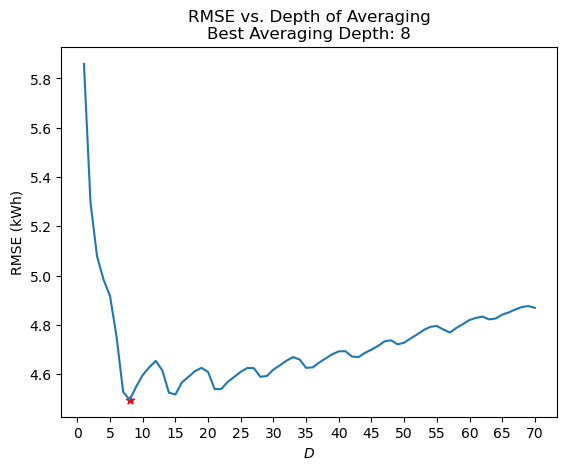

In [144]:
D_array = []
rmse_array = []
max_depth = 70
best_D_rmse = [None, np.inf] # [D, RMSE]

for depth in np.arange(1, max_depth+1, 1):
    
    # create dataframe
    historical_average_df = create_lag_features(train, depth)
    
    # predict values using historical average
    predictions_avg_algo_df = historical_average(historical_average_df, depth)
    
    # calculate RMSE
    train_rmse = mean_squared_error(
        y_true=train["energy_demand"].loc[train.index >= predictions_avg_algo_df.index[0]],
        y_pred=predictions_avg_algo_df["prediction_average_algo"], squared=False)
    
    D_array.append(depth)
    rmse_array.append(train_rmse)
    
    if train_rmse < best_D_rmse[1]:
        best_D_rmse[0] = depth
        best_D_rmse[1] = train_rmse
        

# visuals
sns.lineplot(x=D_array, y=rmse_array, markevery=[0,1,2,3,4,5])
plt.scatter(x=best_D_rmse[0], y=best_D_rmse[1], marker="*", color="red")
plt.title(f"RMSE vs. Depth of Averaging\nBest Averaging Depth: {best_D_rmse[0]}")
plt.xlabel("$D$")
plt.ylabel("RMSE (kWh)")
plt.xticks(np.arange(0, max_depth+1, 5))
plt.show()


In [113]:
best_D = best_D_rmse[0]

# create dataframe
historical_average_df = create_lag_features(test, depth)
    
# predict values using historical average
predictions_avg_algo_df = historical_average(historical_average_df, depth)

# calculate RMSE
test_rmse = mean_squared_error(
    y_true=test["energy_demand"].loc[test.index >= predictions_avg_algo_df.index[0]],
    y_pred=predictions_avg_algo_df["prediction_average_algo"], squared=False)
print("Test Set RMSE: ", test_rmse, "kWh")

Test Set RMSE:  4.751445857484966 kWh


### k-Nearest Neighbors

*k*-Nearest Neighbors is a supervised machine learning algorithm used for classification and regression. The algorithm calculates the *k* closest training example in a data set. The output is either class membership or the average of all *k* nearest neighbors. Note that different similarity metrics are used, with the most common being Euclidean distance.

Below is a high level summary of the *k*-NN algorithm.

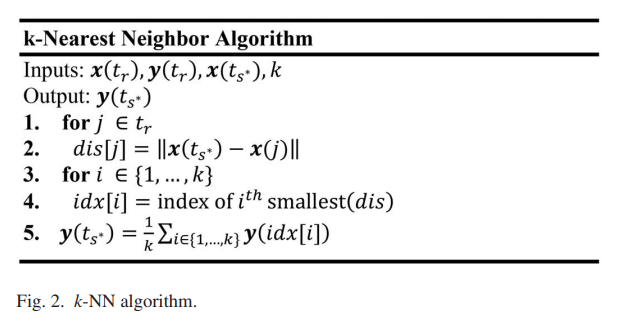


In plain English:

1. For every data point in your training set,
2. Store the distance between the test point and every point in the training set.
3. For the integers 1 to *k*,
4. Store the *k*th nearest datapoint from the training set to the test point.
5. Compute the average of the *k* training set records closest to the test point. Use this value for your prediction. 

The most common distance metric is Euclidean distance, which in 2-D space is the shortest path between two points. Here Euclidean distance is generalized for N-D space:

$$\sqrt{{(x1-y1)}^2 + {(x2-y2)}^2 + \dots + {(xN-yN)}^2}$$

#### Hyperparameters + Train / Validation / Test Split

Let's split our data in a way that doesn't violate the temporality of our data. Specifically we shouldn't have test data whose time index comes *before* our training data's time index. 

Here, we exhaustively search for the best depth (controls the number of features) and best number of neighbors of our kNN algorithm.

Due to the high computational cost, the below cell takes a couple minutes to run.

In [174]:
from sklearn.neighbors import KNeighborsRegressor

max_depth = 60
max_neighbors = 20
best_params = [None, None, np.inf] # depth, num_neighbors, RMSE

for depth in np.arange(1, max_depth+1, 1):
    
    kNN_df = create_lag_features(hourly_energy_demand_df, depth)

    # split into train+validation and test
    X_train_validation, X_test, y_train_validation, y_test = train_test_split(kNN_df.drop(
            columns=[
                "energy_demand", "day", 
                "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday", 
                "Federal Holiday", "Academic Break"
            ]
        ), 
        kNN_df[["energy_demand"]],
        test_size = 0.2, 
        shuffle=False)

    # split into train and validation
    X_train, X_validation, y_train, y_validation = train_test_split(
        X_train_validation, 
        y_train_validation,
        test_size = 0.2, 
        shuffle=False)

    for num_neighbors in np.arange(1, max_neighbors+1, 1):
        kNNRegressor = KNeighborsRegressor(n_neighbors=num_neighbors)
        kNNRegressor.fit(X_train, y_train)
        current_predictions = kNNRegressor.predict(X_validation)
        current_rmse = mean_squared_error(y_true=y_validation, y_pred=current_predictions, squared=False)
        
        if current_rmse < rmse:
            best_params[0] = depth
            best_params[1] = num_neighbors
            best_params[2] = current_rmse

print("Best Depth :", best_params[0], "\nBest # Neighbors :", best_params[1], "\nBest Validation RMSE :", best_params[2])

Best Depth : 60 
Best # Neighbors : 20 
Best Validation RMSE : 4.039415960764692


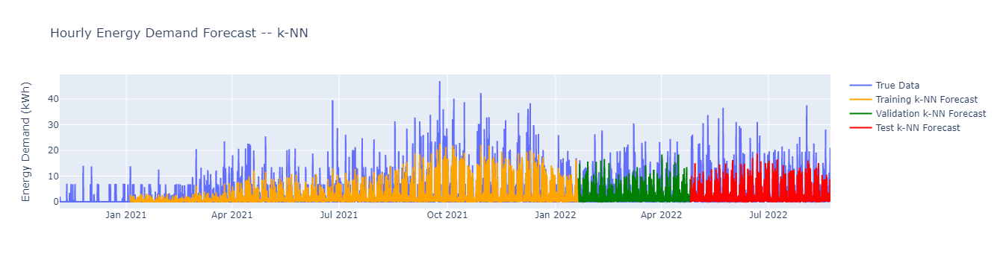

Test Set RMSE: 4.625103999834717 kWh
Validation Set RMSE: 4.039415960764692 kWh


In [173]:
best_num_neighbors = best_params[1]
best_depth = best_params[0]

kNN_df = create_lag_features(hourly_energy_demand_df, best_depth)

# split into train+validation and test
X_train_validation, X_test, y_train_validation, y_test = train_test_split(kNN_df.drop(
        columns=[
            "energy_demand", "day", 
            "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday", 
            "Federal Holiday", "Academic Break"
        ]
    ), 
    kNN_df[["energy_demand"]],
    test_size = 0.2, 
    shuffle=False)

# split into train and validation
X_train, X_validation, y_train, y_validation = train_test_split(
    X_train_validation,
    y_train_validation,
    test_size = 0.2, 
    shuffle=False)

kNNRegressor = KNeighborsRegressor(n_neighbors=best_num_neighbors)
kNNRegressor.fit(X_train, y_train)

test_rmse = mean_squared_error(y_true=y_test, y_pred=kNNRegressor.predict(X_test), squared=False)
validation_rmse = mean_squared_error(y_true=y_validation, y_pred=kNNRegressor.predict(X_validation), squared=False)

# visuals
fig = go.Figure()
fig.add_trace(
    go.Scatter(x = hourly_energy_demand_df["energy_demand"].index , y = hourly_energy_demand_df["energy_demand"], name = "True Data", hovertext=hourly_energy_demand_df["day"])
)
fig.add_trace(
    go.Scatter(x = y_train.index,
               y = kNNRegressor.predict(X_train).reshape(-1), 
               name = "Training k-NN Forecast" , line= {"color":"orange"},
               hovertext = hourly_energy_demand_df["day"])
)
fig.add_trace(
    go.Scatter(x = y_validation.index,
               y = kNNRegressor.predict(X_validation).reshape(-1), 
               name = "Validation k-NN Forecast" , line= {"color":"green"},
               hovertext = hourly_energy_demand_df["day"])
)
fig.add_trace(
    go.Scatter(x = y_test.index,
               y = kNNpredictions.reshape(-1),
               name = "Test k-NN Forecast", line= {"color":"red"},
               hovertext = hourly_energy_demand_df["day"].loc[hourly_energy_demand_df["day"].index >= y_test.index[0]])
)

fig.update_layout({"title" : "Hourly Energy Demand Forecast -- k-NN" , "yaxis_title" : "Energy Demand (kWh)"})
fig.show()
print(f"Test Set RMSE: {test_rmse} kWh")
print(f"Validation Set RMSE: {validation_rmse} kWh")

### Weighted *k*-Nearest Neighbors

Weighted *k*-Nearest Neighbors is a variant on the traditional *k*-Nearest Neighbors algorithm, with the main change that points closer to the query point should contribute more to the final prediction.

Instead of averaging the *k* closest training outputs, their weighted average is used, where the weights are a function of the similarity between input pairs.

The weights are defined based on Dudani's weights, which should arrive at better results, according to the literature. 

In the above figure, the following steps are replaced with step 5:

$\Large w_p = \frac{\mathrm{dis}[k+1] - \mathrm{dis}[p]}{\mathrm{dis}[k+1] - \mathrm{dis}[1]}, \hspace{1cm} p = 1,\dots,k$

where $\mathrm{dis}[p]$ is the distance of the $p$-th nearest neighbor to the query point, $\mathrm{dis}[1]$ is the distance of the nearest neighbor, and $\mathrm{dis}[k+1]$ is the distance of the $k$-th nearest neighbor. $\mathrm{dis}$ is assumed to be sorted in increasing order.

$\Large y(t_{s^*}) = \frac{1}{\sum_{q \in idx}w_q} \sum_{p \in idx}w_p y(p)$

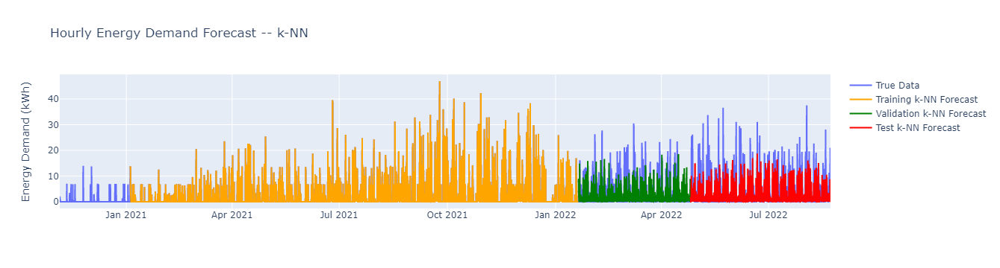

Test Set RMSE: 4.626655389418771 kWh
Validation Set RMSE: 4.044000123590077 kWh


In [175]:
best_num_neighbors = best_params[1]
best_depth = best_params[0]

kNN_df = create_lag_features(hourly_energy_demand_df, best_depth)

# split into train+validation and test
X_train_validation, X_test, y_train_validation, y_test = train_test_split(kNN_df.drop(
        columns=[
            "energy_demand", "day", 
            "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday", 
            "Federal Holiday", "Academic Break"
        ]
    ), 
    kNN_df[["energy_demand"]],
    test_size = 0.2, 
    shuffle=False)

# split into train and validation
X_train, X_validation, y_train, y_validation = train_test_split(
    X_train_validation,
    y_train_validation,
    test_size = 0.2, 
    shuffle=False)

kNNRegressor = KNeighborsRegressor(n_neighbors=best_num_neighbors, weights="distance")
kNNRegressor.fit(X_train, y_train)

test_rmse = mean_squared_error(y_true=y_test, y_pred=kNNRegressor.predict(X_test), squared=False)
validation_rmse = mean_squared_error(y_true=y_validation, y_pred=kNNRegressor.predict(X_validation), squared=False)

# visuals
fig = go.Figure()
fig.add_trace(
    go.Scatter(x = hourly_energy_demand_df["energy_demand"].index , y = hourly_energy_demand_df["energy_demand"], name = "True Data", hovertext=hourly_energy_demand_df["day"])
)
fig.add_trace(
    go.Scatter(x = y_train.index,
               y = kNNRegressor.predict(X_train).reshape(-1), 
               name = "Training k-NN Forecast" , line= {"color":"orange"},
               hovertext = hourly_energy_demand_df["day"])
)
fig.add_trace(
    go.Scatter(x = y_validation.index,
               y = kNNRegressor.predict(X_validation).reshape(-1), 
               name = "Validation k-NN Forecast" , line= {"color":"green"},
               hovertext = hourly_energy_demand_df["day"])
)
fig.add_trace(
    go.Scatter(x = y_test.index,
               y = kNNpredictions.reshape(-1),
               name = "Test k-NN Forecast", line= {"color":"red"},
               hovertext = hourly_energy_demand_df["day"].loc[hourly_energy_demand_df["day"].index >= y_test.index[0]])
)

fig.update_layout({"title" : "Hourly Energy Demand Forecast -- k-NN" , "yaxis_title" : "Energy Demand (kWh)"})
fig.show()
print(f"Test Set RMSE: {test_rmse} kWh")
print(f"Validation Set RMSE: {validation_rmse} kWh")

MAYBE: Forecast the number of users, then use OLS to forecast the power consumption.